# Capstone 2: EDA

### Set up

In [1]:
import os
import pandas as pd
import datetime
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

In [2]:
path = 'C:\\Users\\Shru\\Documents\\Datasets\\gene_expression\\data'
os.chdir(path)

In [3]:
os.getcwd()

'C:\\Users\\Shru\\Documents\\Datasets\\gene_expression\\data'

In [4]:
os.listdir()

['cancer_type_set.csv',
 'fullgenedata.csv',
 'testing_set.csv',
 'training_set.csv']

In [5]:
df = pd.read_csv('fullgenedata.csv',index_col=0)
df.head()

,cancer,AFFX-BioB-5_at,AFFX-BioB-M_at,AFFX-BioB-3_at,AFFX-BioC-5_at,AFFX-BioC-3_at,AFFX-BioDn-5_at,AFFX-BioDn-3_at,AFFX-CreX-5_at,AFFX-CreX-3_at,...,U48730_at,U58516_at,U73738_at,X06956_at,X16699_at,X83863_at,Z17240_at,L49218_f_at,M71243_f_at,Z78285_f_at
Patient_Num,,,,,,,,,,,,,,,,,,,,,
1,ALL,-214,-153,-58,88,-295,-558,199,-176,252,...,185,511,-125,389,-37,793,329,36,191,-37
2,ALL,-139,-73,-1,283,-264,-400,-330,-168,101,...,169,837,-36,442,-17,782,295,11,76,-14
3,ALL,-76,-49,-307,309,-376,-650,33,-367,206,...,315,1199,33,168,52,1138,777,41,228,-41
4,ALL,-135,-114,265,12,-419,-585,158,-253,49,...,240,835,218,174,-110,627,170,-50,126,-91
5,ALL,-106,-125,-76,168,-230,-284,4,-122,70,...,156,649,57,504,-26,250,314,14,56,-25


In [16]:
logregcoef = pd.read_csv('logregcoefficients.csv')
logregcoef.rename(columns={'Unnamed: 0':'Gene'},inplace=True)

logregcoef = logregcoef.sort_values(by='Coefficient',ascending=False)
logregcoef.head()

,Gene,Coefficient
6200,Y00787_s_at,0.000186
1778,M19507_at,0.000175
6208,Z19554_s_at,0.000173
1881,M27891_at,0.000170
1762,M17733_at,0.000167


### Histograms, Pairplots, and other explorations

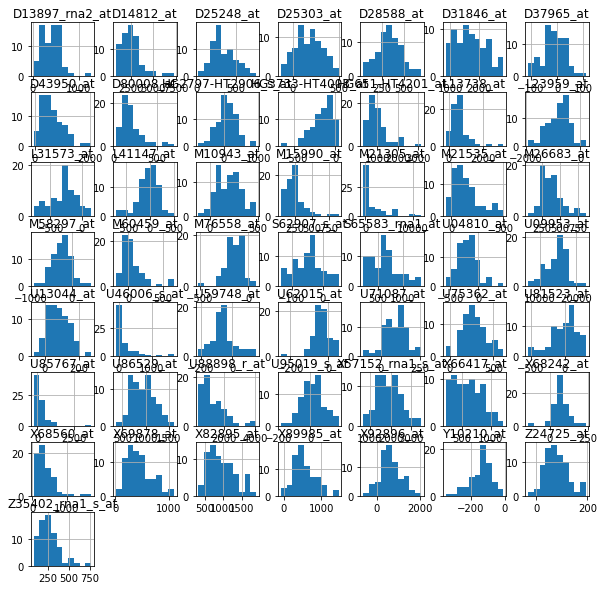

In [44]:
df1 = df.drop(['cancer'],axis=1)
df2 = df1.sample(50,axis=1)

_ = df2.hist(figsize=(10,10))

In [45]:
corr_mat = df2.corr()

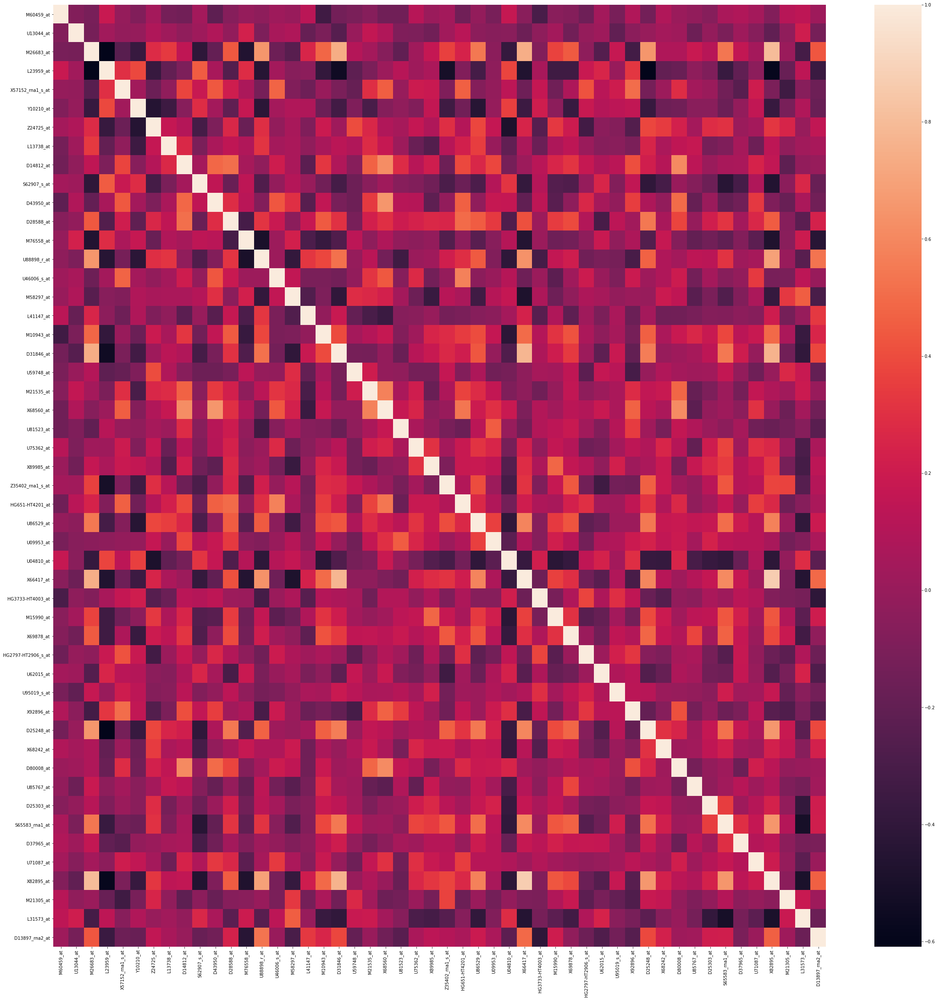

In [46]:
_ = plt.figure(figsize=(40,40))
_ = sns.heatmap(corr_mat)

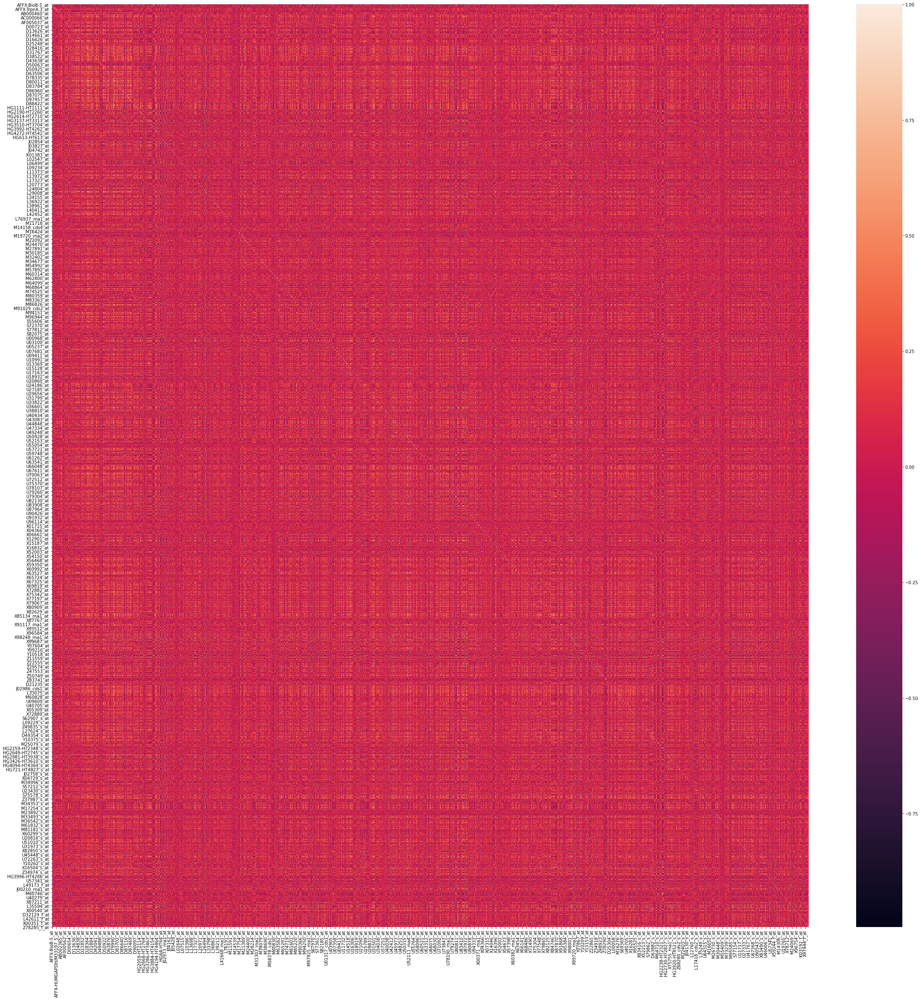

In [11]:
_ = plt.figure(figsize=(40,40))
_ = sns.heatmap(df1.corr())

In [13]:
df[['Y00787_s_at']].groupby(df['cancer']).describe()

Y00787_s_at                                                           \
             count         mean          std    min    25%     50%      75%   
cancer                                                                        
ALL           47.0   766.276596  1780.043999 -104.0   95.0   185.0    317.0   
AML           25.0  7790.880000  7132.604125   20.0  621.0  7229.0  13144.0   

                 
            max  
cancer           
ALL      9270.0  
AML     21147.0

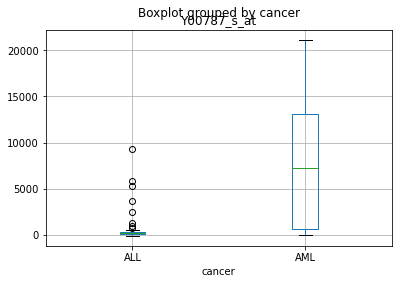

In [18]:
_ = df.boxplot(column=logregcoef.Gene.iloc[0],by='cancer')

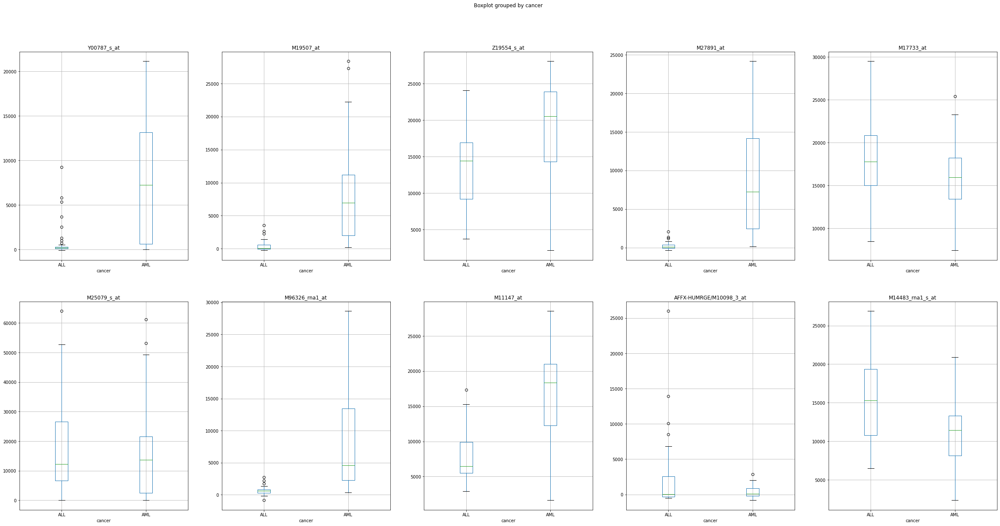

In [43]:
fog, axs = plt.subplots(2,5, figsize=(40,20))

for ax, i in zip(axs.ravel(), range(10)):
    _ = df.boxplot(column=logregcoef.Gene.iloc[i],by='cancer', ax = ax)